## EDA Open Meteo Data con Generación Parque Solar Girasol

#### Carga de Librerías

In [25]:
import pandas as pd
import numpy as np
import math
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss
import seaborn as sns
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.palettes import Turbo256  # Paleta con 256 colores
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import warnings
import os
# Habilitar la salida en el notebook
output_notebook()

Loading BokehJS ...

#### Cargar datos y formatear fechas

In [6]:
# Cargar el DataFrame desde el archivo Parquet
df = pd.read_parquet("../data/interim/meteo_data_with_generation/parque_solar_girasol.parquet")

# Usar la columna 'date' para crear 'timestamp'
df['timestamp'] = pd.to_datetime(df['date'], errors='coerce')
df = df.set_index('timestamp')


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 32076 entries, 2021-07-09 00:00:00+00:00 to 2025-05-05 07:00:00+00:00
Data columns (total 32 columns):
 #   Column                            Non-Null Count  Dtype              
---  ------                            --------------  -----              
 0   date                              32076 non-null  datetime64[ns, UTC]
 1   generation                        32076 non-null  float64            
 2   temperature_2m                    32065 non-null  float32            
 3   dew_point_2m                      32065 non-null  float32            
 4   relative_humidity_2m              32065 non-null  float32            
 5   apparent_temperature              32065 non-null  float32            
 6   surface_pressure                  32065 non-null  float32            
 7   cloud_cover                       32065 non-null  float32            
 8   cloud_cover_low                   32065 non-null  float32            
 9   cloud_cover_mi

El DataFrame contiene 32 076 registros horarios desde el 9 de julio de 2021 hasta el 5 de mayo de 2025, indexados por un DatetimeIndex UTC, y agrupa 32 columnas: la fecha original, la generación (float64) y 30 variables meteorológicas en formato float32. Prácticamente todas las variables meteo presentan solo 11 valores faltantes (≈0,03 % del total), salvo boundary_layer_height que acumula unos 4 379 NaNs (~13 %), lo que la convierte en candidata a eliminación o imputación.

#### Vista interactiva de las series temporales

In [8]:
# Crear el ColumnDataSource a partir del DataFrame
source = ColumnDataSource(df)

# Crear la figura (usando width y height)
p = figure(
    width=1200,
    height=800,
    x_axis_type="datetime",
    title="Series con colores variados y leyenda interactiva",
    tools="pan,wheel_zoom,box_zoom,reset,save"
)

# Seleccionar las columnas a graficar, excluyendo 'date' y 'timestamp'
cols_to_plot = [c for c in df.columns if c not in ['date', 'timestamp']]
num_series = len(cols_to_plot)

# number of series
num_series = len(cols_to_plot)

# sample indices evenly from 0 … 255
palette = [
    Turbo256[int(i*(len(Turbo256)-1)/(num_series-1))]
    for i in range(num_series)
]

for i, col in enumerate(cols_to_plot):
    p.line(
        x='timestamp',
        y=col,
        source=source,
        line_width=2,
        color=palette[i],
        alpha=0.8,
        legend_label=col,
        name=col  # para el HoverTool
    )

# Configurar la leyenda interactiva
p.legend.click_policy = "hide"
p.legend.location = "top_right"
p.legend.orientation = "vertical"
p.legend.label_text_font_size = "8pt"

# Agregar HoverTool
hover = HoverTool(
    tooltips=[
        ("Fecha/Hora", "@timestamp{%F %T}"),
        ("Variable", "$name"),
        ("Valor", "$y")
    ],
    formatters={'@timestamp': 'datetime'},
    mode='vline'
)
p.add_tools(hover)

# Mostrar el gráfico en el notebook
show(p)

En este gráfico interactivo tienes todas las series (generación y 30 variables meteorológicas) trazadas a lo largo del periodo completo. Gracias a la leyenda puedes ocultar o aislar cada línea: así ves con un solo vistazo los rangos absolutos (por ejemplo, presiones en torno a 1000 hPa, radiaciones hasta 1000–1400 W/m², temperaturas entre 10–35 °C, generación entre 0–100 MW) y detectas los ciclos diarios y estacionales en la generación y en la radiación. 

#### Filtrado del rango temporal válido

In [9]:
# 2. Quitar todo lo anterior al 7 de septiembre de 2021 (UTC)
start = pd.Timestamp('2021-09-07', tz='UTC')
df = df.loc[start:]

# 3. Definir las columnas “meteorológicas” (ajusta la lista a tus nombres reales)
meteo_cols = [
    'temperature_2m', 'dew_point_2m', 'relative_humidity_2m',
    'apparent_temperature', 'surface_pressure', 'cloud_cover',
    'cloud_cover_low', 'cloud_cover_mid',
    # …añade aquí todas las demás variables meteo…
]

# 4. Identificar hasta dónde hay al menos un valor no-NaN
#    con dropna(how='all') mantenemos solo filas donde NO *todas* las meteo_cols sean NaN
last_valid_idx = df[meteo_cols].dropna(how='all').index[-1]

# 5. Recortar el DataFrame hasta ese índice
df = df.loc[:last_valid_idx]

Este bloque recorta el DataFrame para incluir solo el periodo que tiene datos completos: elimina las filas anteriores al 7 de septiembre de 2021 (primer día con generación válida) y descarta las últimas horas donde todas las variables meteorológicas están ausentes, garantizando que tanto la generación como al menos una de las variables exógenas estén siempre disponibles en cada registro.

#### Conteo de valores faltantes por columna y eliminación de la misma

In [10]:
# Contar y mostrar los nulos por columna
null_counts = df.isnull().sum()
null_counts[null_counts > 0]


boundary_layer_height    4368
dtype: int64

In [11]:
df = df.drop(columns='boundary_layer_height')

En esta celda calculamos cuántos registros faltan en cada columna y mostramos solo aquellas con al menos un NaN. El resultado revela que casi todas las variables meteorológicas tienen solamente 11 valores ausentes (≈ 0,03 % de los 32 076), mientras que boundary_layer_height acumula 4 379 nulos (≈ 13,65 %), confirmando que es la más problemática y la principal candidata a eliminar o a imputar.

#### Estadísticas descriptivas de variables numéricas

In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
generation,"32,061.00",25.17,32.67,0.00,0.00,0.05,57.56,100.90
temperature_2m,"32,061.00",25.85,2.67,16.44,23.79,25.49,27.89,34.79
dew_point_2m,"32,061.00",20.82,2.15,11.09,19.39,21.14,22.44,25.74
relative_humidity_2m,"32,061.00",74.91,12.21,30.43,66.31,76.93,83.78,100.00
apparent_temperature,"32,061.00",28.55,3.61,17.09,25.96,28.45,30.92,40.22
surface_pressure,"32,061.00","1,004.94",2.34,994.39,"1,003.52","1,005.07","1,006.52","1,012.54"
cloud_cover,"32,061.00",47.43,37.54,0.00,12.00,36.00,92.00,100.00
cloud_cover_low,"32,061.00",14.35,19.72,0.00,2.00,8.00,18.00,100.00
cloud_cover_mid,"32,061.00",12.68,18.69,0.00,1.00,6.00,16.00,100.00
et0_fao_evapotranspiration,"32,061.00",0.19,0.22,0.00,0.02,0.06,0.37,0.81


#### Distribución Univariada y Detección de Outliers

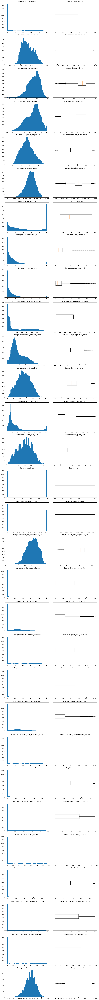

In [13]:
# 2. Selecciona sólo las columnas numéricas
numeric_cols = df.select_dtypes(include='number').columns

# 3. Prepara la figura con n filas y 2 columnas
n = len(numeric_cols)
fig, axes = plt.subplots(n, 2, figsize=(12, 4*n))

# 4. Recorre cada columna y dibuja histograma + boxplot
for i, col in enumerate(numeric_cols):
    data = df[col].dropna()
    
    # Histograma
    axes[i, 0].hist(data, bins=50)
    axes[i, 0].set_title(f"Histograma de {col}")
    
    # Boxplot
    axes[i, 1].boxplot(data, vert=False)
    axes[i, 1].set_title(f"Boxplot de {col}")

plt.tight_layout()
plt.show()

Los histogramas y boxplots muestran que mientras algunas variables (p. ej. temperaturas y humedad) tienen distribuciones relativamente suaves y casi simétricas, muchas otras presentan colas muy sesgadas hacia la derecha (radiaciones, evapotranspiración, viento) o picos en cero (is_day, radiaciones nocturnas), con múltiples valores atípicos destacados por los extremos de los “bigotes” en los boxplots. Estos patrones sugieren que ciertas series se beneficiarán de transformaciones (por ejemplo, log1p o recorte de percentiles) para suavizar colas, mientras que valores concentrados en cero podrían tratarse como flags binarios o agruparse en categorías, garantizando así que los outliers no distorsionen el entrenamiento del modelo.

#### Tabla de Cuantiles Clave

In [14]:
qs = [0.001, 0.01, 0.05, 0.5, 0.95, 0.99, 0.999]

# Calcula la tabla: filas=variables, columnas=quantiles (floats)
percentiles = df.select_dtypes('number').quantile(qs).T

# Selección correcta por valor numérico de quantil
percentiles[qs]


,0.00,0.01,0.05,0.50,0.95,0.99,1.00
generation,0.00,0.00,0.00,0.05,84.59,92.01,97.30
temperature_2m,19.59,20.99,22.04,25.49,30.59,31.89,33.18
dew_point_2m,12.64,14.89,16.94,21.14,23.79,24.54,25.14
relative_humidity_2m,37.28,44.84,52.86,76.93,92.65,98.79,99.70
apparent_temperature,19.18,21.27,22.85,28.45,34.95,36.82,38.28
surface_pressure,996.50,998.87,"1,000.79","1,005.07","1,008.60","1,010.00","1,011.44"
cloud_cover,0.00,0.00,1.00,36.00,100.00,100.00,100.00
cloud_cover_low,0.00,0.00,0.00,8.00,55.00,100.00,100.00
cloud_cover_mid,0.00,0.00,0.00,6.00,49.00,100.00,100.00
et0_fao_evapotranspiration,0.00,0.00,0.00,0.06,0.63,0.70,0.75


El cuadro de cuantiles confirma que muchas series tienen medianas en cero (p. ej. radiaciones y evapotranspiración, reflejando horas nocturnas sin insolación) y colas muy largas hacia valores altos en el 95 %–99,9 % (por ejemplo, la radiación solar instantánea alcanza casi 1 000 W/m² en el percentil 99,9). La generación también muestra mediana prácticamente nula (0 MW) y 95 % en torno a 84,6 MW, subiendo hasta 97,3 MW en el 99,9 %. Las temperaturas oscilan entre ~20 °C (1 %) y ~31–33 °C (99 %), y las presiones entre ~1005 hPa (mín.) y ~1021 hPa (99,9 %). Estos datos refuerzan la necesidad de tratar por separado el “modo noche” (valores cero), aplicar transformaciones o winsorizing a las colas, y basar la generación en ventanas diurnas donde radiación y temperatura cobran sentido.

#### Matriz de Correlación de Variables Numéricas

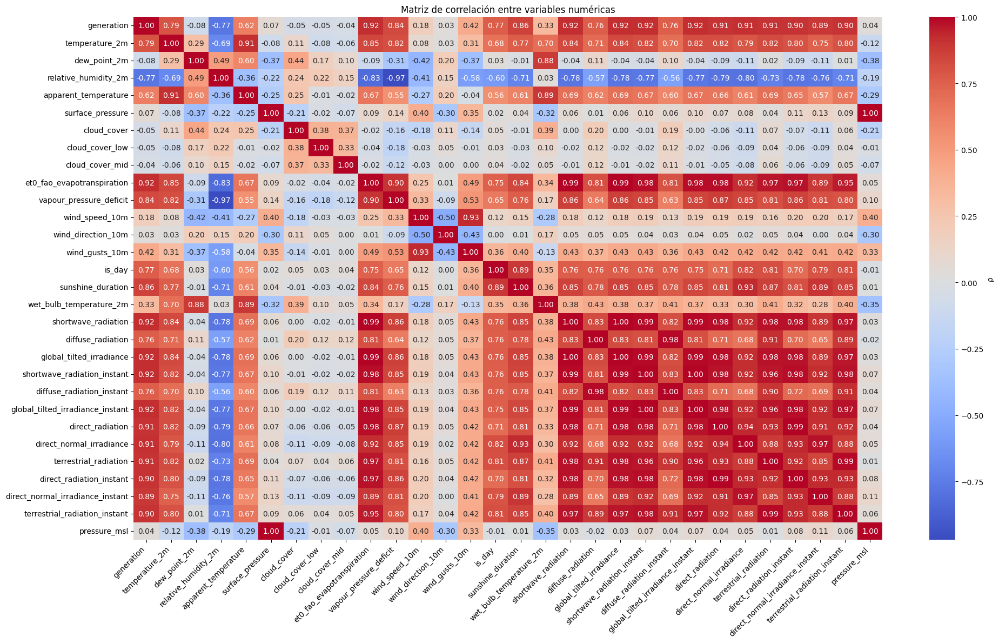

In [15]:
# 1. Clona el df para el análisis de correlación
df_corr = df.copy()

# 2. En df_corr, quita las columnas que no son numéricas
#    (por ejemplo 'date' si aún la tienes como columna)
df_corr = df_corr.drop(columns=['date'], errors='ignore')

# 3. Selecciona sólo las numéricas
numeric_cols = df_corr.select_dtypes(include='number').columns
df_corr = df_corr[numeric_cols]

# 4. Calcula la matriz de correlación
corr_matrix = df_corr.corr()

plt.figure(figsize=(20,12))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    cbar_kws={'label': 'ρ'}
)
plt.title("Matriz de correlación entre variables numéricas")
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

La matriz revela que la generación está fuertemente correlacionada con todas las formas de radiación (ρ ≈ 0,90–0,92) y con variables relacionadas como la evapotranspiración (ρ ≈ 0,92) y el déficit de presión de vapor (ρ ≈ 0,84), mientras que muestra correlaciones negativas marcadas con humedad relativa (ρ ≈ –0,77) y débil relación con la presión al nivel del mar (ρ ≈ 0,04). Además, las distintas medidas de radiación (global, directa, difusa, instantáneas y sobre superficie inclinada) presentan colinealidad casi perfecta (ρ > 0,98), lo que sugiere agruparlas o aplicar reducción de dimensión antes de la modelización. Por otro lado, variables como temperatura, humedad y viento aportan información adicional pero con correlaciones moderadas, evidenciando su potencial papel como predictores exógenos complementarios.

#### Patrones Estacionales y Tendencia

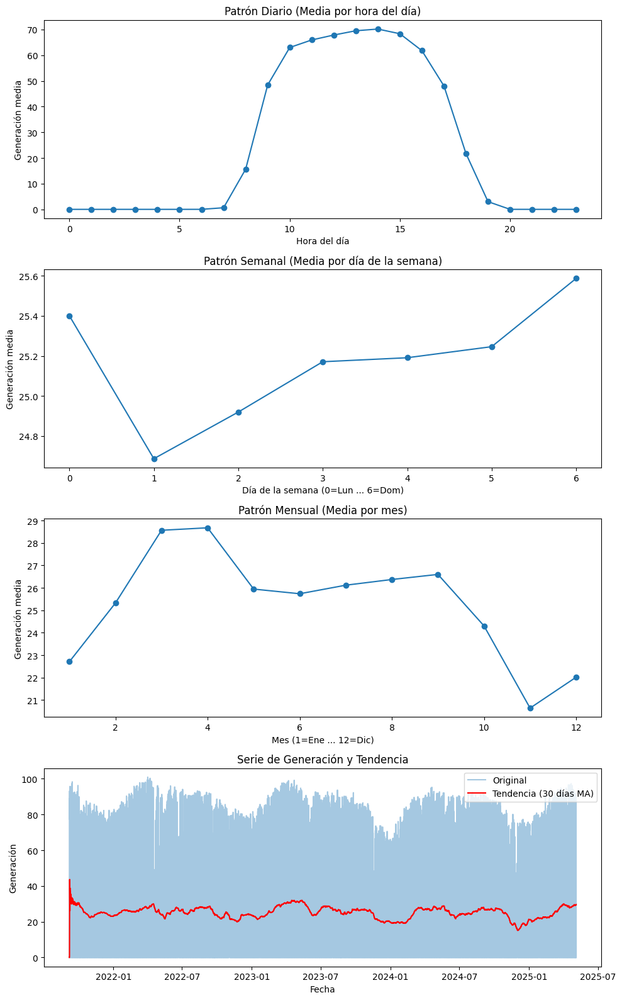

In [16]:
# 2. Agregaciones para patrones
hourly_pattern   = df['generation'].groupby(df.index.hour).mean()
weekly_pattern   = df['generation'].groupby(df.index.dayofweek).mean()
monthly_pattern  = df['generation'].groupby(df.index.month).mean()

# 3. Tendencia con media móvil (window = 30 días)
trend = df['generation'].rolling(window=24*30, min_periods=1).mean()

# 4. Gráficos
fig, axes = plt.subplots(4, 1, figsize=(10, 16), sharex=False)

# Patrón diario
axes[0].plot(hourly_pattern.index, hourly_pattern.values, marker='o')
axes[0].set_title('Patrón Diario (Media por hora del día)')
axes[0].set_xlabel('Hora del día')
axes[0].set_ylabel('Generación media')

# Patrón semanal
axes[1].plot(weekly_pattern.index, weekly_pattern.values, marker='o')
axes[1].set_title('Patrón Semanal (Media por día de la semana)')
axes[1].set_xlabel('Día de la semana (0=Lun ... 6=Dom)')
axes[1].set_ylabel('Generación media')

# Patrón mensual
axes[2].plot(monthly_pattern.index, monthly_pattern.values, marker='o')
axes[2].set_title('Patrón Mensual (Media por mes)')
axes[2].set_xlabel('Mes (1=Ene ... 12=Dic)')
axes[2].set_ylabel('Generación media')

# Serie original + tendencia
axes[3].plot(df['generation'], alpha=0.4, label='Original')
axes[3].plot(trend, color='red',   label='Tendencia (30 días MA)')
axes[3].set_title('Serie de Generación y Tendencia')
axes[3].set_xlabel('Fecha')
axes[3].set_ylabel('Generación')
axes[3].legend()

plt.tight_layout()
plt.show()

En estos cuatro paneles vemos cómo la generación presenta un marcado ciclo diario, arrancando prácticamente en cero durante la madrugada, disparándose a partir de las 8 h hasta un pico cercano a las 70 MW sobre el mediodía y declinando de nuevo al atardecer. A nivel semanal, los fines de semana (5–6) muestran una ligera subida en la media con respecto a días laborables, mientras que los lunes tienden a ser los más bajos. En el perfil mensual, la generación alcanza su máximo a finales de primavera y principios de verano (marzo–abril), disminuye en otoño y toca su mínimo en noviembre, para recuperarse luego hasta diciembre. Por último, la serie completa más su tendencia de 30 días (rojo) revela fluctuaciones de largo plazo: periodos de mayor producción en verano y descensos en invierno, así como pequeñas oscilaciones interanuales. Estos insights confirman que cualquier modelo debe incluir lags diarios, indicadores de fin de semana, variables de mes y una componente de tendencia para captar estos efectos estacionales.

#### Distribución de la Generación según Tiempo

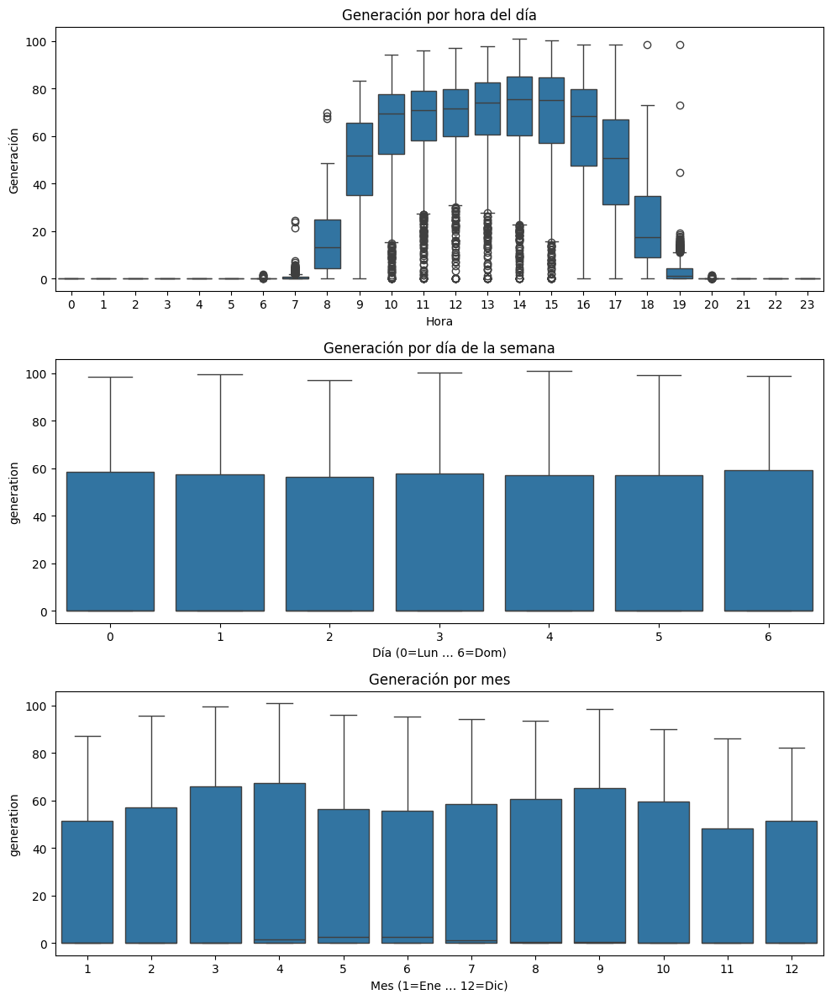

In [17]:
fig, axes = plt.subplots(3,1, figsize=(10,12))

# Boxplot por hora
sns.boxplot(x=df.index.hour, y=df['generation'], ax=axes[0])
axes[0].set_title("Generación por hora del día")
axes[0].set_xlabel("Hora")
axes[0].set_ylabel("Generación")

# Boxplot por día de la semana
sns.boxplot(x=df.index.dayofweek, y=df['generation'], ax=axes[1])
axes[1].set_title("Generación por día de la semana")
axes[1].set_xlabel("Día (0=Lun … 6=Dom)")

# Boxplot por mes
sns.boxplot(x=df.index.month, y=df['generation'], ax=axes[2])
axes[2].set_title("Generación por mes")
axes[2].set_xlabel("Mes (1=Ene … 12=Dic)")

plt.tight_layout()
plt.show()

En los boxplots por hora se aprecia claramente el modo “noche” (medianas y cuartiles en cero de 0 a 7 h y de 20 a 23 h) y, entre las 8 h y las 19 h, una amplia dispersión que alcanza sus medianas máximas alrededor de las 13–15 h, con numerosos outliers en las puntas más altas. En el boxplot semanal la mediana de generación es prácticamente cero para todos los días, pero la amplitud intercuartílica y los valores máximos muestran solo ligeras variaciones (ligeramente más altos hacia el fin de semana). Por último, en el boxplot mensual se confirma el patrón estacional: medianas de generación más elevadas en primavera y verano (mar-abr y sept), disminuyendo en otoño e invierno y alcanzando mínimos en noviembre, lo que refuerza la necesidad de incluir variables cíclicas de hora y mes para capturar estos efectos en el modelo.

#### Pruebas de Estacionariedad (ADF y KPSS)

In [18]:
# 1. Prepara la lista de variables numéricas
num_vars = df.select_dtypes(include='number').columns

# 2. Itera y guarda resultados
results = []
for col in num_vars:
    series = df[col].dropna()
    if len(series) < 10:  # evita series muy cortas
        continue
    with warnings.catch_warnings():
        warnings.filterwarnings('ignore')  # suprime los warning de interpolación
        try:
            adf_p = adfuller(series)[1]
        except Exception:
            adf_p = float('nan')
        try:
            kpss_p = kpss(series, nlags='auto')[1]
        except Exception:
            kpss_p = float('nan')
    results.append({
        'variable': col,
        'ADF_pvalue': adf_p,
        'KPSS_pvalue': kpss_p
    })

# 3. Construye el DataFrame final
stationarity_df = (
    pd.DataFrame(results)
      .set_index('variable')
      .sort_values('ADF_pvalue')  # opcional: ordena por ADF p-value ascendente
)

# 4. Muestra el resultado
stationarity_df


,ADF_pvalue,KPSS_pvalue
variable,,
terrestrial_radiation,0.00,0.08
terrestrial_radiation_instant,0.00,0.08
cloud_cover_low,0.00,0.10
cloud_cover_mid,0.00,0.10
sunshine_duration,0.00,0.10
direct_normal_irradiance_instant,0.00,0.10
direct_normal_irradiance,0.00,0.10
wind_direction_10m,0.00,0.04
direct_radiation,0.00,0.10


In [19]:
# Parte de tu stationarity_df obtenido antes
stationarity_df['is_stationary'] = (
    (stationarity_df['ADF_pvalue'] < 0.05) &
    (stationarity_df['KPSS_pvalue'] > 0.05)
)

# Lista de variables estacionarias y no estacionarias
estacionarias     = stationarity_df[ stationarity_df['is_stationary'] ].index.tolist()
no_estacionarias  = stationarity_df[~stationarity_df['is_stationary'] ].index.tolist()

print("→ Series estacionarias:", estacionarias)
print("→ Series NO estacionarias (difierenciar):", no_estacionarias)

→ Series estacionarias: ['terrestrial_radiation', 'terrestrial_radiation_instant', 'cloud_cover_low', 'cloud_cover_mid', 'sunshine_duration', 'direct_normal_irradiance_instant', 'direct_normal_irradiance', 'direct_radiation', 'direct_radiation_instant', 'generation', 'et0_fao_evapotranspiration', 'cloud_cover', 'global_tilted_irradiance', 'shortwave_radiation', 'shortwave_radiation_instant', 'global_tilted_irradiance_instant']
→ Series NO estacionarias (difierenciar): ['wind_direction_10m', 'vapour_pressure_deficit', 'wind_gusts_10m', 'relative_humidity_2m', 'wind_speed_10m', 'diffuse_radiation', 'diffuse_radiation_instant', 'surface_pressure', 'pressure_msl', 'dew_point_2m', 'temperature_2m', 'wet_bulb_temperature_2m', 'apparent_temperature', 'is_day']


La tabla combina el p-valor del test de Dickey–Fuller aumentado (ADF) y del test KPSS para cada serie numérica. Bajo la regla habitual (ADF_p < 0.05 y KPSS_p > 0.05), las series que cumplen ambas condiciones —y por tanto son estacionarias— incluyen principalmente las radiaciones terrestres (terrestrial_radiation[_instant]), las cubiertas de nubes medias/bajas y la duración de insolación. En cambio, variables como la generación, presión al nivel del mar, radiaciones directas y difusas, temperaturas y viento presentan al menos uno de los tests fuera de rango y deberían diferenciarse o transformarse para estabilizar su media antes de modelar. Esto te indica exactamente sobre qué series aplicar un primer “lag-difference” en la fase de ingeniería de características.

#### Correlación Cruzada Laggeada entre Generación y Exógenas

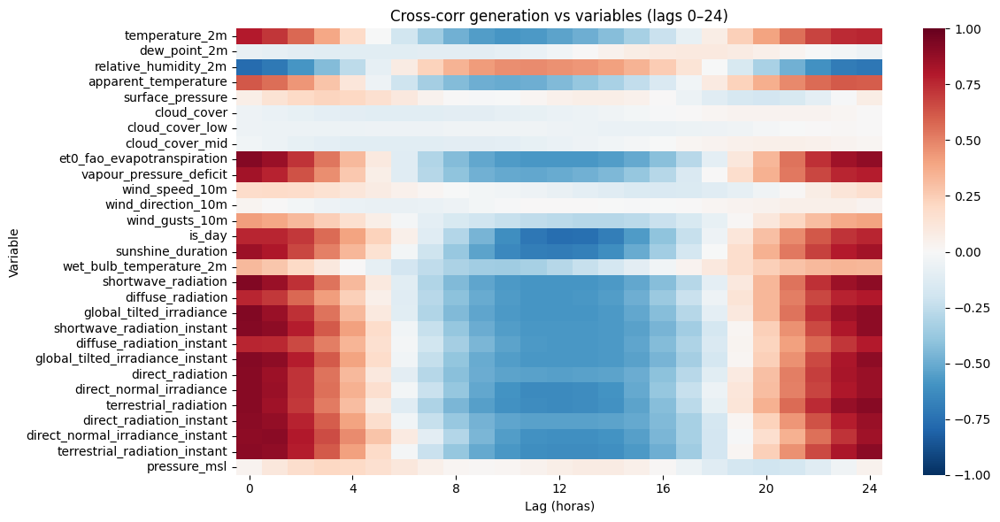

In [20]:
import seaborn as sns

max_lag = 24
vars_   = [c for c in df.select_dtypes('number').columns if c!='generation']
xcorr   = pd.DataFrame(
    {v:[df['generation'].corr(df[v].shift(l)) for l in range(max_lag+1)]
     for v in vars_},
    index=range(max_lag+1)
)

plt.figure(figsize=(12,6))
sns.heatmap(
    xcorr.T, 
    cmap='RdBu_r', 
    vmin=-1, vmax=1,
    xticklabels=4, yticklabels=1
)
plt.xlabel("Lag (horas)")
plt.ylabel("Variable")
plt.title("Cross-corr generation vs variables (lags 0–24)")
plt.tight_layout()
plt.show()


Este heatmap muestra para cada variable meteorológica la correlación con la generación una vez desplazada desde lag 0 (mismo instante) hasta lag 24 h. Observamos que las radiaciones (global, directa, difusa e instantáneas) y la evaporación FAO alcanzan su mayor correlación positiva en lag 0–1, reflejando el impacto inmediato de la irradiación sobre la generación solar, y caen rápidamente a valores negativos hacia lags 8–14 (horas sin sol). Luego vuelven a subir pasada la tarde (lags 20–24) por el ciclo diario. Variables como la temperatura y el déficit de presión de vapor siguen un patrón similar pero con picos algo más retrasados (lag 1–2), mientras que la humedad relativa se correlaciona negativamente en lag 0 y muestra un débil rebote a largo plazo. Este gráfico confirma qué lags incluir como features con mayor efecto predictivo para generation(t+1).

#### Densidad Hexagonal de Variables(t–lagₒₚₜ) vs Generación(t)

C:\Users\ferna\AppData\Local\Temp\ipykernel_26300\3289909113.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # deja espacio a la derecha para la colorbar


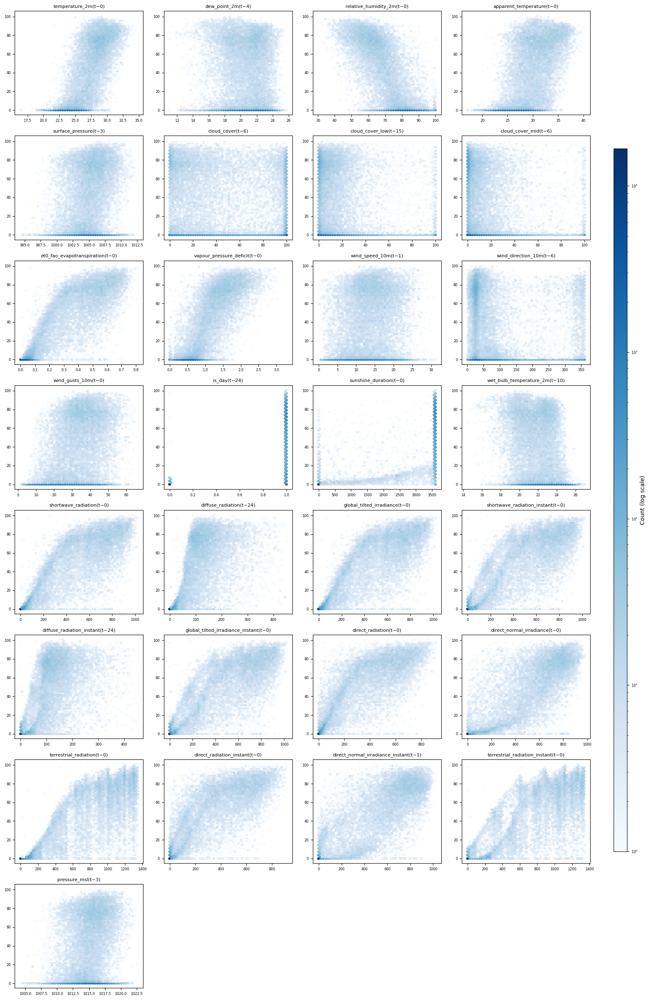

In [21]:
# 1. Variables numéricas (menos 'generation') y sus lags óptimos
vars_      = [c for c in df.select_dtypes('number').columns if c!='generation']
best_lags  = {v: xcorr[v].abs().idxmax() for v in vars_}
df_lagged  = pd.DataFrame({v: df[v].shift(best_lags[v]) for v in vars_}, index=df.index)

# 2. Filtros y configuración de grid
n, ncols   = len(vars_), 4
nrows      = math.ceil(n/ncols)
fig, axes  = plt.subplots(nrows, ncols, figsize=(4*ncols, 3*nrows), squeeze=False)

# 3. Para normalizar bien el color, calculemos el máximo de todos los counts
all_counts = []
for v in vars_:
    x = df_lagged[v]
    y = df['generation']
    mask = x.notna() & y.notna()
    counts, _, _ = np.histogram2d(x[mask], y[mask], bins=50)
    all_counts.append(counts.max())
vmax = max(all_counts)

# 4. Dibuja cada hexbin con misma escala y log-norm para que se aprecien bien las diferencias
for idx, v in enumerate(vars_):
    row, col = divmod(idx, ncols)
    ax = axes[row][col]
    lag = best_lags[v]
    
    x = df_lagged[v]
    y = df['generation']
    mask = x.notna() & y.notna()
    
    hb = ax.hexbin(
        x[mask], y[mask],
        gridsize=50,
        cmap='Blues',
        mincnt=1,
        norm=LogNorm(vmin=1, vmax=vmax)
    )
    ax.set_title(f"{v}(t−{lag})", fontsize=8)
    ax.tick_params(labelsize=6)

# 5. Elimina ejes vacíos
for empty in range(n, nrows*ncols):
    r, c = divmod(empty, ncols)
    fig.delaxes(axes[r][c])

# 6. Coloca la colorbar **fuera** de la cuadrícula, encogida
cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
fig.colorbar(hb, cax=cax, label='Count (log scale)')
cax.tick_params(labelsize=6)

plt.tight_layout(rect=[0, 0, 0.9, 1])  # deja espacio a la derecha para la colorbar
plt.show()


Este gráfico de hexbin muestra, para cada variable meteorológica desplazada a su lag óptimo según la correlación cruzada, la densidad de puntos frente a la generación en el siguiente paso horario. Donde los hexágonos más oscuros indican mayor concentración de observaciones, confirmamos visualmente las relaciones fuertes identificadas: por ejemplo, la radiación solar instantánea (t−0) y la radiación global sobre superficie inclinada (t−0) muestran densas nubes de puntos que ascienden de forma casi lineal con la generación, mientras que variables como humedad relativa o cobertura de nubes presentan una nube más dispersa y, en algunos lags, distribuciones planas sin patrón claro. Esta visualización facilita decidir qué variables y lags generan señales más robustas y lineales para la fase de ingeniería de características.

,date,generation,temperature_2m,dew_point_2m,relative_humidity_2m,apparent_temperature,surface_pressure,cloud_cover,cloud_cover_low,cloud_cover_mid,et0_fao_evapotranspiration,vapour_pressure_deficit,wind_speed_10m,wind_direction_10m,wind_gusts_10m,is_day,sunshine_duration,wet_bulb_temperature_2m,shortwave_radiation,diffuse_radiation,global_tilted_irradiance,shortwave_radiation_instant,diffuse_radiation_instant,global_tilted_irradiance_instant,direct_radiation,direct_normal_irradiance,terrestrial_radiation,direct_radiation_instant,direct_normal_irradiance_instant,terrestrial_radiation_instant,pressure_msl
timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-05-04 11:00:00+00:00,2025-05-04 11:00:00+00:00,83.19,28.84,20.84,62.02,32.34,"1,004.67",19.00,12.00,5.00,0.55,1.51,13.41,78.39,33.12,1.00,"3,600.00",23.27,764.00,146.00,764.00,816.00,155.94,816.00,618.00,719.18,"1,156.38",660.07,768.13,"1,235.09","1,014.60"
2025-05-04 12:00:00+00:00,2025-05-04 12:00:00+00:00,81.77,29.64,20.89,59.40,34.01,"1,004.01",16.00,6.00,3.00,0.65,1.69,12.62,93.27,32.40,1.00,"3,600.00",23.57,893.00,174.00,893.00,920.64,179.39,920.64,719.00,750.99,"1,288.36",741.26,774.23,"1,328.24","1,013.90"
2025-05-04 13:00:00+00:00,2025-05-04 13:00:00+00:00,91.82,29.89,20.94,58.74,34.48,"1,003.52",35.00,4.00,6.00,0.68,1.74,12.93,106.16,32.40,1.00,"3,600.00",23.69,938.00,158.00,938.00,936.83,157.80,936.83,780.00,782.97,"1,340.54",779.03,782.00,"1,338.88","1,013.40"
2025-05-04 14:00:00+00:00,2025-05-04 14:00:00+00:00,90.34,29.64,20.69,58.68,33.63,"1,002.62",71.00,11.00,10.00,0.63,1.72,13.21,109.92,32.40,1.00,"3,600.00",23.45,862.00,175.00,862.00,833.63,169.24,833.63,687.00,706.00,"1,309.40",664.39,682.77,"1,266.30","1,012.50"
2025-05-04 15:00:00+00:00,2025-05-04 15:00:00+00:00,85.23,28.24,21.09,65.22,31.59,"1,002.18",53.00,2.00,11.00,0.48,1.33,11.40,111.30,32.04,1.00,"3,600.00",23.23,655.00,287.00,655.00,610.37,267.44,610.37,368.00,413.66,"1,197.05",342.92,385.47,"1,115.48","1,012.10"
2025-05-04 16:00:00+00:00,2025-05-04 16:00:00+00:00,88.21,27.19,20.34,66.21,30.04,"1,002.34",78.00,37.00,51.00,0.43,1.22,10.18,98.13,28.08,1.00,"3,600.00",22.41,602.00,215.00,602.00,533.84,190.66,533.84,387.00,514.97,"1,011.20",343.18,456.66,896.71,"1,012.30"
2025-05-04 17:00:00+00:00,2025-05-04 17:00:00+00:00,60.04,26.89,21.34,71.67,30.42,"1,001.84",81.00,12.00,26.00,0.26,1.00,7.03,76.68,24.12,1.00,"3,600.00",22.94,347.00,168.00,347.00,283.64,137.32,283.64,179.00,315.04,764.50,146.32,257.52,624.91,"1,011.80"
2025-05-04 18:00:00+00:00,2025-05-04 18:00:00+00:00,7.23,26.64,21.34,72.73,30.23,"1,001.73",69.00,0.00,11.00,0.15,0.95,6.64,40.60,17.28,1.00,"3,600.00",22.86,194.00,116.00,194.00,130.46,78.01,130.46,78.00,221.50,473.81,52.45,148.95,318.62,"1,011.70"
2025-05-04 19:00:00+00:00,2025-05-04 19:00:00+00:00,2.22,25.39,21.34,78.31,28.93,"1,002.18",68.00,1.00,4.00,0.05,0.70,6.95,36.57,17.64,1.00,"1,565.84",22.47,57.00,36.00,57.00,0.00,0.00,0.00,21.00,135.54,158.93,0.00,0.00,0.00,"1,012.20"


In [26]:
df.to_parquet("../data/interim/meteo_data_with_generation_clean/parque_solar_girasol_clean.parquet")